In [1]:
import math

people=['Charlie','Augustus','Veruca','Violet','Mike','Joe','Willy','Miranda']

links=[('Augustus', 'Willy'), 
       ('Mike', 'Joe'), 
       ('Miranda', 'Mike'), 
       ('Violet', 'Augustus'), 
       ('Miranda', 'Willy'), 
       ('Charlie', 'Mike'), 
       ('Veruca', 'Joe'), 
       ('Miranda', 'Augustus'), 
       ('Willy', 'Augustus'), 
       ('Joe', 'Charlie'), 
       ('Veruca', 'Augustus'), 
       ('Miranda', 'Joe')]

In [2]:
from PIL import Image,ImageDraw
def drawnetwork(sol):
    #建立image对象
    img = Image.new('RGB',(400,400),"white")
    draw=ImageDraw.Draw(img)
    #建立坐标位置信息的字典
    pos=dict([(people[i],(sol[i*2],sol[i*2+1])) for i in range(0,len(people))])
    #绘制连线
    for (a,b) in links:
        draw.line((pos[a],pos[b]),fill=(255,0,0))
    
    #绘制代表人的结点
    for n,p in pos.items():
        draw.text(p,n,(0,0,0))
    img.show()

In [3]:
sol=[120,200,250,125,0,0,25,50,120,0,250,300,23,250,200,320]
drawnetwork(sol)

In [4]:
from PIL import Image,ImageDraw
img = Image.new('RGB',(400,400),(255,255,255))
draw=ImageDraw.Draw(img)
img.show()

## PANDAS

In [1]:
import pandas as pd

## 复杂网络分析库NetworkX
#### http://blog.sciencenet.cn/blog-404069-337865.html

In [19]:
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


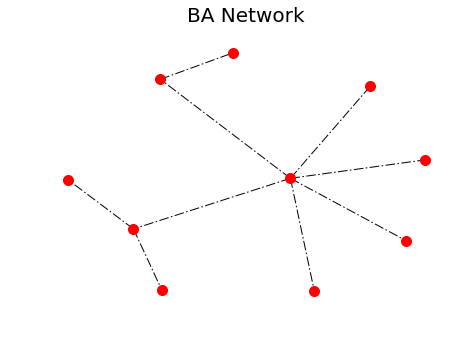

In [51]:
#生成一个BA无标度网络n=10,m=1
g = nx.random_graphs.barabasi_albert_graph(10,1)
nx.draw(g,node_size=100,node_shape="o",style="dashdot",with_labels=False)
plt.title("BA Network",fontsize=20)
plt.show()
#plt.savefig("test.png")

[1, 2, 3]
[(2, 3)]
1


E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


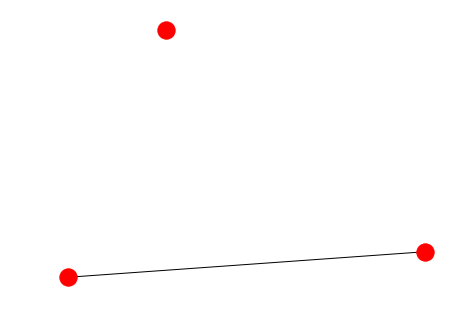

In [55]:
G = nx.Graph()
G.add_node(1)#添加一个节点1
G.add_edge(2,3)#添加一条边2-3（隐含着添加了两个节点2、3）
print(G.nodes())
print(G.edges())
print(G.number_of_edges())
nx.draw(G)
plt.show()

### 度、度分布

In [72]:
gg = nx.random_graphs.barabasi_albert_graph(1000,3)
print(gg.degree(0))#返回某个节点的度
print(gg.degree)#返回所有节点的度
print(nx.degree_histogram(gg))#返回图中所有节点的度分布序列（从1至最大度的出现频次）
#nx.draw(gg)
#plt.show()

63
<bound method Graph.degree of <networkx.classes.graph.Graph object at 0x0BF422D0>>
[0, 0, 0, 400, 206, 105, 84, 45, 29, 21, 19, 13, 7, 4, 10, 9, 7, 4, 3, 3, 2, 1, 3, 2, 1, 3, 0, 0, 3, 0, 0, 0, 2, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]


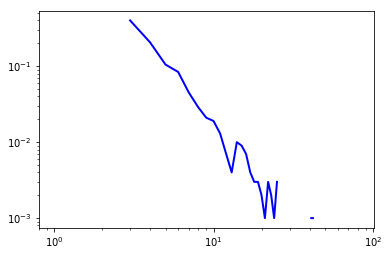

In [74]:
import matplotlib.pyplot as plt                 #导入科学绘图的matplotlib包
degree =  nx.degree_histogram(gg)          #返回图中所有节点的度分布序列
x = range(len(degree))                             #生成x轴序列，从1到最大度
y = [z / float(sum(degree)) for z in degree]  
#将频次转换为频率，这用到Python的一个小技巧：列表内涵，Python的确很方便：）
plt.loglog(x,y,color="blue",linewidth=2)           #在双对数坐标轴上绘制度分布曲线  
plt.show()                                                          #显示图表

In [75]:
#群聚系数
nx.clustering(gg)

{0: 0.018433179723502304,
 1: 0.041666666666666664,
 2: 0.020731707317073172,
 3: 0.023266022827041263,
 4: 0.058333333333333334,
 5: 0.018437225636523266,
 6: 0.016681299385425813,
 7: 0.012654320987654321,
 8: 0.017857142857142856,
 9: 0.017316017316017316,
 10: 0.0195578231292517,
 11: 0.021164021164021163,
 12: 0.01349527665317139,
 13: 0.010482180293501049,
 14: 0.016129032258064516,
 15: 0.009523809523809525,
 16: 0.021739130434782608,
 17: 0.017825311942959002,
 18: 0.025,
 19: 0.023228803716608595,
 20: 0.007905138339920948,
 21: 0.021164021164021163,
 22: 0.03571428571428571,
 23: 0.009523809523809525,
 24: 0.012987012987012988,
 25: 0.016666666666666666,
 26: 0.14285714285714285,
 27: 0.0,
 28: 0.0,
 29: 0.0,
 30: 0.01932367149758454,
 31: 0.03508771929824561,
 32: 0.03296703296703297,
 33: 0.014112903225806451,
 34: 0.0,
 35: 0.08888888888888889,
 36: 0.008333333333333333,
 37: 0.01098901098901099,
 38: 0.032679738562091505,
 39: 0.005263157894736842,
 40: 0.0147058823529411

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


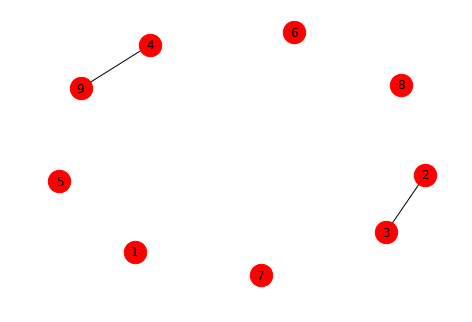

In [159]:
gx = nx.Graph()
#adding nodes
#gx.add_node("zhen")
gx.add_nodes_from([1,2,3,4,5,6,7,8,9])#list
#gx.add_edge(2,3)#添加一条边2-3（隐含着添加了两个节点2、3）
gx.add_edges_from([(2,3),(9,4)])
nx.draw(gx,with_labels=True,node_size=500)
plt.show()

### GIRVAN_NEWMAN
#### https://networkx.readthedocs.io/en/latest/reference/generated/networkx.algorithms.community.centrality.girvan_newman.html

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


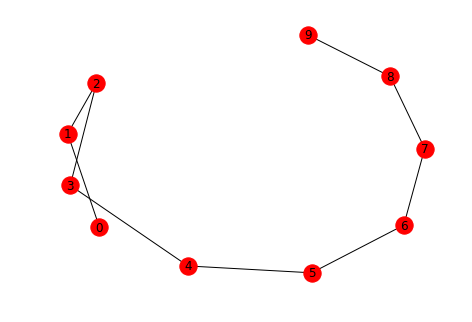

In [172]:
GG = nx.path_graph(10)
#GG.add_nodes_from([1,2,3,4,5,6,7,8,9])#list
nx.draw(GG,with_labels=True)
plt.show()

In [54]:
# -*- coding: utf-8 -*-
# centrality.py - functions for computing communities using centrality notions
#
# Copyright 2015, 2016 NetworkX developers.
#
# This file is part of NetworkX.
#
# NetworkX is distributed under a BSD license; see LICENSE.txt for more
# information.
"""Functions for computing communities based on centrality notions."""

import networkx as nx

__all__ = ['girvan_newman']


def girvan_newman(G, most_valuable_edge=None):
    """Finds communities in a graph using the Girvan–Newman method.

    Parameters
    ----------
    G : NetworkX graph

    most_valuable_edge : function
        Function that takes a graph as input and outputs an edge. The
        edge returned by this function will be recomputed and removed at
        each iteration of the algorithm.

        If not specified, the edge with the highest
        :func:`networkx.edge_betweenness_centrality` will be used.

    Returns
    -------
    iterator
        Iterator over tuples of sets of nodes in `G`. Each set of node
        is a community, each tuple is a sequence of communities at a
        particular level of the algorithm.

    Examples
    --------
    To get the first pair of communities::

        >>> G = nx.path_graph(10)
        >>> comp = girvan_newman(G)
        >>> tuple(sorted(c) for c in next(comp))
        ([0, 1, 2, 3, 4], [5, 6, 7, 8, 9])

    To get only the first *k* tuples of communities, use
    :func:`itertools.islice`::

        >>> import itertools
        >>> G = nx.path_graph(8)
        >>> k = 2
        >>> comp = girvan_newman(G)
        >>> for communities in itertools.islice(comp, k):
        ...     print(tuple(sorted(c) for c in communities)) # doctest: +SKIP
        ...
        ([0, 1, 2, 3], [4, 5, 6, 7])
        ([0, 1], [2, 3], [4, 5, 6, 7])

    To stop getting tuples of communities once the number of communities
    is greater than *k*, use :func:`itertools.takewhile`::

        >>> import itertools
        >>> G = nx.path_graph(8)
        >>> k = 4
        >>> comp = girvan_newman(G)
        >>> limited = itertools.takewhile(lambda c: len(c) <= k, comp)
        >>> for communities in limited:
        ...     print(tuple(sorted(c) for c in communities)) # doctest: +SKIP
        ...
        ([0, 1, 2, 3], [4, 5, 6, 7])
        ([0, 1], [2, 3], [4, 5, 6, 7])
        ([0, 1], [2, 3], [4, 5], [6, 7])

    To just choose an edge to remove based on the weight::

        >>> from operator import itemgetter
        >>> G = nx.path_graph(10)
        >>> edges = G.edges()
        >>> nx.set_edge_attributes(G, 'weight', {(u, v): v for u, v in edges})
        >>> def heaviest(G):
        ...     u, v, w = max(G.edges(data='weight'), key=itemgetter(2))
        ...     return (u, v)
        ...
        >>> comp = girvan_newman(G, most_valuable_edge=heaviest)
        >>> tuple(sorted(c) for c in next(comp))
        ([0, 1, 2, 3, 4, 5, 6, 7, 8], [9])

    To utilize edge weights when choosing an edge with, for example, the
    highest betweenness centrality::

        >>> from networkx import edge_betweenness_centrality as betweenness
        >>> def most_central_edge(G):
        ...     centrality = betweenness(G, weight='weight')
        ...     return max(centrality, key=centrality.get)
        ...
        >>> G = nx.path_graph(10)
        >>> comp = girvan_newman(G, most_valuable_edge=most_central_edge)
        >>> tuple(sorted(c) for c in next(comp))
        ([0, 1, 2, 3, 4], [5, 6, 7, 8, 9])

    To specify a different ranking algorithm for edges, use the
    `most_valuable_edge` keyword argument::

        >>> from networkx import edge_betweenness_centrality
        >>> from random import random
        >>> def most_central_edge(G):
        ...     centrality = edge_betweenness_centrality(G)
        ...     max_cent = max(centrality.values())
        ...     # Scale the centrality values so they are between 0 and 1,
        ...     # and add some random noise.
        ...     centrality = {e: c / max_cent for e, c in centrality.items()}
        ...     # Add some random noise.
        ...     centrality = {e: c + random() for e, c in centrality.items()}
        ...     return max(centrality, key=centrality.get)
        ...
        >>> G = nx.path_graph(10)
        >>> comp = girvan_newman(G, most_valuable_edge=most_central_edge)

    Notes
    -----
    The Girvan–Newman algorithm detects communities by progressively
    removing edges from the original graph. The algorithm removes the
    "most valuable" edge, traditionally the edge with the highest
    betweenness centrality, at each step. As the graph breaks down into
    pieces, the tightly knit community structure is exposed and the
    result can be depicted as a dendrogram.

    """
    # If the graph is already empty, simply return its connected
    # components.
    if G.number_of_edges() == 0:
        yield tuple(nx.connected_components(G))
        return
    # If no function is provided for computing the most valuable edge,
    # use the edge betweenness centrality.
    if most_valuable_edge is None:
        def most_valuable_edge(G):
            """Returns the edge with the highest betweenness centrality
            in the graph `G`.

            """
            # We have guaranteed that the graph is non-empty, so this
            # dictionary will never be empty.
            betweenness = nx.edge_betweenness_centrality(G)
            return max(betweenness, key=betweenness.get)
    # The copy of G here must include the edge weight data.
    g = G.copy().to_undirected()
    # Self-loops must be removed because their removal has no effect on
    # the connected components of the graph.
    g.remove_edges_from(g.selfloop_edges())
    while g.number_of_edges() > 0:
        yield _without_most_central_edges(g, most_valuable_edge)



def _without_most_central_edges(G, most_valuable_edge):
    """Returns the connected components of the graph that results from
    repeatedly removing the most "valuable" edge in the graph.

    `G` must be a non-empty graph. This function modifies the graph `G`
    in-place; that is, it removes edges on the graph `G`.

    `most_valuable_edge` is a function that takes the graph `G` as input
    (or a subgraph with one or more edges of `G` removed) and returns an
    edge. That edge will be removed and this process will be repeated
    until the number of connected components in the graph increases.

    """
    original_num_components = nx.number_connected_components(G)
    num_new_components = original_num_components
    while num_new_components <= original_num_components:
        edge = most_valuable_edge(G)
        G.remove_edge(*edge)
        new_components = tuple(nx.connected_components(G))
        num_new_components = len(new_components)
    return new_components

In [136]:
comp = girvan_newman(GG)
tuple(sorted(c) for c in next(comp))

([0, 1, 2, 3, 4], [5, 6, 7, 8, 9])

In [129]:
next(comp)

({0, 1, 2}, {3, 4}, {5, 6}, {7, 8, 9})

### To get only the first k tuples of communities, use itertools.islice():

In [144]:
"""
itertools.islice(iterable, start, stop[, step])

返回的迭代器是返回了输入迭代器根据索引来选取的项

创建一个迭代器，生成项的方式类似于切片返回值： iterable[start : stop : step]，将跳过前start个项，迭代在stop所指定的位置停止，step指定用于跳过项的步幅。 
与切片不同，负值不会用于任何start，stop和step， 
如果省略了start，迭代将从0开始，如果省略了step，步幅将采用1.

返回序列seq的从start开始到stop结束的步长为step的元素的迭代器
 """
import itertools
GG = nx.path_graph(8)
k = 2
comp = girvan_newman(GG)
for communites in itertools.islice(comp,k):
    print(tuple(sorted(c) for c in communites))

([0, 1, 2, 3], [4, 5, 6, 7])
([0, 1], [2, 3], [4, 5, 6, 7])


### To stop getting tuples of communities once the number of communities is greater than k, use itertools.takewhile():

In [179]:
"""
itertools.takewhile(predicate, iterable)
和dropwhile相反

创建一个迭代器，生成iterable中predicate(item)为True的项，只要predicate计算为False，迭代就会立即停止。

即：从序列的头开始, 直到执行函数func失败.
 """
GG = nx.path_graph(8)
k = 4
comp = girvan_newman(GG)
limited = itertools.takewhile(lambda c: len(c)<=k,comp)
for communites in limited:
    print(tuple(sorted(c) for c in communites))

([0, 1, 2, 3], [4, 5, 6, 7])
([0, 1], [2, 3], [4, 5, 6, 7])
([0, 1], [2, 3], [4, 5], [6, 7])


E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


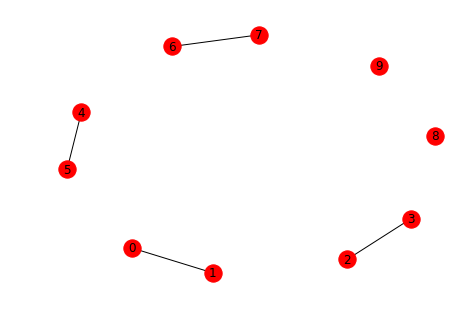

In [184]:
"""
迭代完之后重新构建一个图
 """
GGG = nx.Graph()
GGG.add_nodes_from(range(0,10))
GGG.add_edges_from([(0, 1), (2, 3), (4, 5), (6, 7)])
nx.draw(GGG,with_labels=True)
plt.show()

#### 节点聚类系数描述子图中通过该节点的三角形的个数，即
$$C_{n} = \frac{2e_{n}}{(k_{n}(k_{n}-1))}$$
#### 其中，$k_{n}$表示节点n邻接点的个数，$e_{n}$表示$k_{n}$个节点之间存在边数

In [185]:
"""
群聚系数
"""
nx.clustering(GGG)

{0: 0.0,
 1: 0.0,
 2: 0.0,
 3: 0.0,
 4: 0.0,
 5: 0.0,
 6: 0.0,
 7: 0.0,
 8: 0.0,
 9: 0.0}

In [186]:
nx.edge_betweenness_centrality(GGG)

{(0, 1): 0.022222222222222223,
 (2, 3): 0.022222222222222223,
 (4, 5): 0.022222222222222223,
 (6, 7): 0.022222222222222223}

### 衡量网络模块化的指标Q值
#### 设网络为$N=(V,E),P_{k}={(V_{1},E_{1}),(V_{2},E_{2}),...,(V_{k},E_{k})}$为一个分划
#### $E_{ij}$表示网络中连接两个不同社区点的边在所有边中所占的比例，这两点节点分别位于第i个社区和第j个社区。
#### 定义每行（或者列）中各元素之和为$a_{i} = \sum_{j} E_{ij}$
#### Newman和Girvan提出一种衡量网络社区结构的指标Q值
$$Q = \sum_{i}(E_{ij}-a_{i}^{2}) = Tr(E)-||E^{2}||$$

In [4]:
import hac

In [3]:
hac.DataType

hac.DataType

In [6]:
from hac import GreedyAgglomerativeClusterer
import networkx as nx

In [66]:
clusterer = GreedyAgglomerativeClusterer()

In [5]:
karate_dendrogram = clusterer.cluster(nx.karate_club_graph())

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


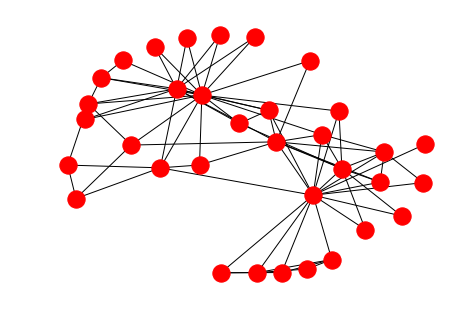

In [332]:
nx.draw(nx.karate_club_graph())

In [7]:
karate_dendrogram.clusters(1)

[{0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33}]

In [10]:
karate_dendrogram.clusters(2)

[{0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 16, 17, 19, 21},
 {8, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33}]

In [11]:
karate_dendrogram.clusters(3)

[{8, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33},
 {1, 2, 3, 7, 9, 12, 13, 17, 21},
 {0, 4, 5, 6, 10, 11, 16, 19}]

In [12]:
o = nx.karate_club_graph()

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


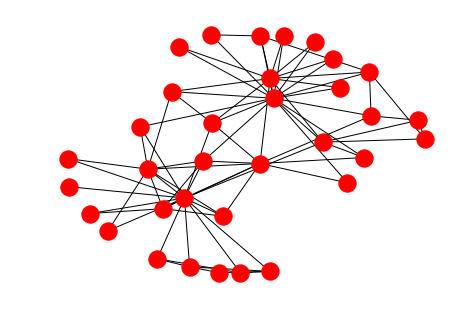

78


In [22]:
nx.draw(o)
plt.show()
print(o.size())

In [168]:
karate_dendrogram.clusters()

NameError: name 'karate_dendrogram' is not defined

In [26]:
karate_dendrogram.labels()

{0: 2,
 1: 1,
 2: 1,
 3: 1,
 4: 2,
 5: 2,
 6: 2,
 7: 1,
 8: 0,
 9: 1,
 10: 2,
 11: 2,
 12: 1,
 13: 1,
 14: 0,
 15: 0,
 16: 2,
 17: 1,
 18: 0,
 19: 2,
 20: 0,
 21: 1,
 22: 0,
 23: 0,
 24: 0,
 25: 0,
 26: 0,
 27: 0,
 28: 0,
 29: 0,
 30: 0,
 31: 0,
 32: 0,
 33: 0}

In [29]:
forced_clusters = [set([33,0]),set([32,1])]
forced_karate_dendrogram = clusterer.cluster(nx.karate_club_graph(),forced_clusters = forced_clusters)
forced_karate_dendrogram.clusters()

[{0, 9, 11, 12, 14, 15, 17, 18, 19, 21, 26, 29, 33},
 {1, 2, 3, 7, 8, 13, 20, 22, 30, 32},
 {23, 24, 25, 27, 28, 31},
 {4, 5, 6, 10, 16}]

In [44]:
GGG = nx.Graph()
GGG.add_nodes_from(range(0,34))
GGG.add_edges_from([(0,i) for i in [9,11,12,14,15,17,18,19,21,26,29,33]])
GGG.add_edges_from([(9,i) for i in [0,11,12,14,15,17,18,19,21,26,29,33]])
GGG.add_edges_from([(11,i) for i in [0,9,12,14,15,17,18,19,21,26,29,33]])
GGG.add_edges_from([(12,i) for i in [0,11,9,14,15,17,18,19,21,26,29,33]])
GGG.add_edges_from([(14,i) for i in [0,11,12,9,15,17,18,19,21,26,29,33]])
GGG.add_edges_from([(15,i) for i in [0,11,12,14,9,17,18,19,21,26,29,33]])
GGG.add_edges_from([(17,i) for i in [0,11,12,14,15,9,18,19,21,26,29,33]])
GGG.add_edges_from([(18,i) for i in [0,11,12,14,15,17,9,19,21,26,29,33]])
GGG.add_edges_from([(19,i) for i in [0,11,12,14,15,17,18,9,21,26,29,33]])
GGG.add_edges_from([(21,i) for i in [0,11,12,14,15,17,18,19,9,26,29,33]])
GGG.add_edges_from([(26,i) for i in [0,11,12,14,15,17,18,19,21,9,29,33]])
GGG.add_edges_from([(29,i) for i in [0,11,12,14,15,17,18,19,21,26,9,33]])
GGG.add_edges_from([(33,i) for i in [0,11,12,14,15,17,18,19,21,26,29,9]])


In [45]:
GGG.add_edges_from([(1,i) for i in [2,3,7,8,13,20,22,30,32]])
GGG.add_edges_from([(2,i) for i in [1,3,7,8,13,20,22,30,32]])
GGG.add_edges_from([(3,i) for i in [2,1,7,8,13,20,22,30,32]])
GGG.add_edges_from([(7,i) for i in [2,3,1,8,13,20,22,30,32]])
GGG.add_edges_from([(8,i) for i in [2,3,7,1,13,20,22,30,32]])
GGG.add_edges_from([(13,i) for i in [2,3,7,8,1,20,22,30,32]])
GGG.add_edges_from([(20,i) for i in [2,3,7,8,13,1,22,30,32]])
GGG.add_edges_from([(22,i) for i in [2,3,7,8,13,20,1,30,32]])
GGG.add_edges_from([(30,i) for i in [2,3,7,8,13,20,22,1,32]])
GGG.add_edges_from([(32,i) for i in [2,3,7,8,13,20,22,30,1]])

In [46]:
GGG.add_edges_from([(23,i) for i in [ 24, 25, 27, 28, 31]])
GGG.add_edges_from([(24,i) for i in [ 23, 25, 27, 28, 31]])
GGG.add_edges_from([(25,i) for i in [ 24, 23, 27, 28, 31]])
GGG.add_edges_from([(27,i) for i in [ 24, 25, 23, 28, 31]])
GGG.add_edges_from([(28,i) for i in [ 24, 25, 27, 23, 31]])
GGG.add_edges_from([(31,i) for i in [ 24, 25, 27, 28, 23]])

In [48]:
GGG.add_edges_from([(4,i) for i in [  5, 6, 10, 16]])
GGG.add_edges_from([(5,i) for i in [  4, 6, 10, 16]])
GGG.add_edges_from([(6,i) for i in [  5, 4, 10, 16]])
GGG.add_edges_from([(10,i) for i in [  5, 6, 4, 16]])
GGG.add_edges_from([(16,i) for i in [  5, 6, 10, 4]])

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


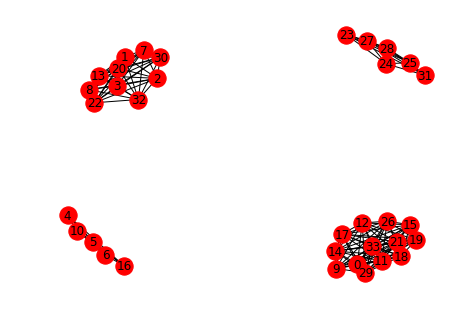

In [49]:
nx.draw(GGG,with_labels=True)
plt.show()

### 手打真的太麻烦了。。。

In [110]:
forced_karate_dendrogram.clusters()

[{0, 9, 11, 12, 14, 15, 17, 18, 19, 21, 26, 29, 33},
 {1, 2, 3, 7, 8, 13, 20, 22, 30, 32},
 {23, 24, 25, 27, 28, 31},
 {4, 5, 6, 10, 16}]

In [51]:
type(forced_karate_dendrogram.clusters())

list

In [55]:
len(forced_karate_dendrogram.clusters())

4

In [113]:
forced_karate_dendrogram.clusters()[3]

{4, 5, 6, 10, 16}

In [115]:

test_list=[]
test_j_list = []
for i in forced_karate_dendrogram.clusters()[3]:
    test_j_list.append(i)
    
for i in range(len(test_j_list)):
    for j in range(i+1,len(test_j_list)):
        k = test_j_list[i]
        j = test_j_list[j]
        a = (k,j)
        test_list.append(a)


In [114]:

test_j_list = []
for i in  forced_karate_dendrogram.clusters()[3]:
        test_j_list.append(i)
print(test_j_list)

[16, 10, 4, 5, 6]


In [116]:
print(test_list)
print(type(test_list[1]))
print(len(test_list))

[(16, 10), (16, 4), (16, 5), (16, 6), (10, 4), (10, 5), (10, 6), (4, 5), (4, 6), (5, 6)]
<class 'tuple'>
10


E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


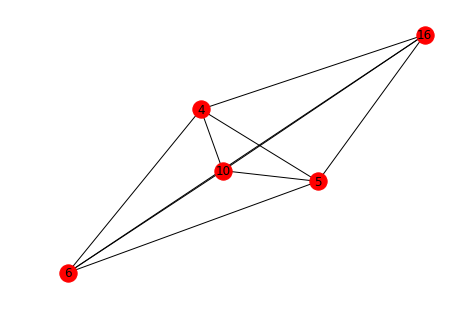

In [117]:
test_g = nx.Graph()
GGG.add_nodes_from(range(0,34))
test_g.add_edges_from(test_list)

nx.draw(test_g,with_labels=True)
plt.show()

### 定义成一个函数

In [48]:
def edges_list(graph_list):
    test_list=[]
    test_j_list = []
    for i in graph_list:
        test_j_list.append(i)

    for i in range(len(test_j_list)):
        for j in range(i+1,len(test_j_list)):
            k = test_j_list[i]
            j = test_j_list[j]
            a = (k,j)
            test_list.append(a)
            
    return test_list

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


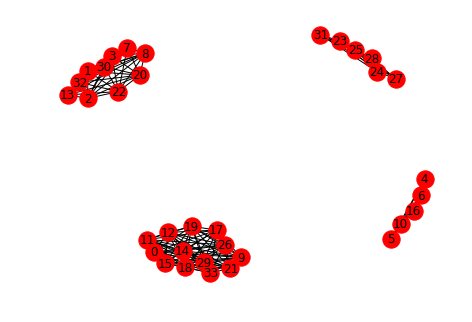

In [179]:
test_gg = nx.Graph()
GGG.add_nodes_from(range(0,34))
test_gg.add_edges_from(edges_list(forced_karate_dendrogram.clusters()[3]))
test_gg.add_edges_from(edges_list(forced_karate_dendrogram.clusters()[0]))
test_gg.add_edges_from(edges_list(forced_karate_dendrogram.clusters()[1]))
test_gg.add_edges_from(edges_list(forced_karate_dendrogram.clusters()[2]))

nx.draw(test_gg,with_labels=True)
#plt.figure(figsize = (12,8))
plt.show()



In [7]:
import tushare as ts

In [8]:
df = ts.get_hs300s()
df.to_excel('F:/项目/复杂网络/300_stock.xlsx')

In [7]:
df['code'][0]

'000413'

In [8]:
stock_list = ['60038','454645']

In [9]:
stock_list[1]

'454645'

## xlrd读取excel表格的数据

In [9]:
import xlrd

In [10]:
test_staock = xlrd.open_workbook("F:/项目/复杂网络/沪深300成分股列表.xls")

In [11]:
test_sheet = test_staock.sheets()[0]

In [12]:
test_cols = test_sheet.col_values(0)

In [13]:
test_cols[1]

'000002'

In [16]:
test_df = ts.get_k_data('000963',start = '2014-11-11',end = '2016-01-08')
print(test_df)

           date    open   close    high     low   volume    code
194  2014-11-11  55.107  54.178  55.107  53.501  24371.0  000963
195  2014-11-12  53.772  53.801  54.459  53.385  13212.0  000963
196  2014-11-13  53.752  52.998  53.752  51.759  23970.0  000963
197  2014-11-14  52.349  53.955  54.362  52.262  13434.0  000963
198  2014-11-17  53.327  53.607  54.488  53.327  14016.0  000963
199  2014-11-18  53.578  54.052  54.662  53.433  10895.0  000963
200  2014-11-19  54.517  53.897  54.565  53.772  11228.0  000963
201  2014-11-20  53.220  52.301  53.772  51.875  21913.0  000963
202  2014-11-21  52.195  51.566  52.340  51.189  24227.0  000963
203  2014-11-24  51.827  50.308  51.856  49.805  72688.0  000963
204  2014-11-25  50.202  52.417  52.417  50.018  42489.0  000963
205  2014-11-26  52.127  51.276  52.127  50.840  33706.0  000963
206  2014-11-27  51.314  50.260  51.353  49.999  54853.0  000963
207  2014-11-28  50.269  50.521  50.676  48.983  50873.0  000963
208  2014-12-01  50.560  

In [17]:
import numpy as np
t_dff = test_df['close'].sort_index()
test_dff = np.array(t_dff)
print(np.shape(t_dff))
print(len(test_dff))
print(type(test_dff))
print(test_dff)

(258,)
258
<class 'numpy.ndarray'>
[ 54.178  53.801  52.998  53.955  53.607  54.052  53.897  52.301  51.566
  50.308  52.417  51.276  50.26   50.521  53.046  53.017  52.243  51.45
  50.473  49.97   48.973  50.918  50.947  52.253  54.188  52.388  52.833
  52.427  50.869  50.879  49.495  49.437  49.244  50.26   48.857  50.308
  50.898  51.856  52.824  53.694  53.394  53.694  54.787  54.662  53.22
  54.729  54.817  54.875  55.02   57.08   55.977  55.571  55.155  55.223
  53.133  51.933  51.614  52.204  52.814  51.276  49.873  49.466  49.138
  49.679  50.734  51.43   50.473  50.482  50.734  51.13   51.643  51.634
  51.469  51.363  53.578  53.182  52.243  52.814  53.211  52.243  52.882
  55.929  61.521  61.918  61.985  61.531  61.347  60.757  62.363  63.04
  61.889  59.925  60.573  60.08   61.55   61.579  62.295  63.92   61.918
  60.95   65.352  67.868  66.087  65.362  70.383  69.638  69.957  72.56
  71.941  70.141  68.129  68.516  66.494  67.635  67.432  67.926  65.981
  65.062  63.543  65

In [165]:
test_mf = ts.get_h_data('000413',start = '2014-11-11',end = '2016-01-08')

[Getting data:]#####

E:\anconda\lib\site-packages\tushare\stock\trading.py:447: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  df = df.sort('date', ascending=False)


In [183]:
t_mff = test_mf['close'].sort_index()
test_mff =np.array(t_mff)
print(len(test_mff))
print(type(test_mff))
print(test_mff)

235
<class 'numpy.ndarray'>
[  9.94  10.06   9.92  10.28  10.25  10.19  10.18  10.03  10.21  10.37
  11.41  11.26  10.84  10.63  10.75  10.61  10.3   10.1   10.38  10.36
  10.42  10.45  10.6   11.07  10.95  10.87  10.96  11.06  11.87  12.38
  12.49  13.74  14.85  14.3   14.45  14.79  14.05  14.06  14.44  15.89
  16.2   15.86  16.12  16.18  15.83  16.74  15.98  15.99  16.08  15.95
  16.13  16.75  16.48  16.62  17.21  17.72  17.74  17.85  17.25  16.08
  15.93  16.37  15.47  16.08  16.52  16.66  16.82  16.66  15.76  16.4
  15.94  15.75  15.05  14.74  14.9   15.4   15.81  15.66  15.82  15.74
  15.28  15.19  15.86  16.23  16.53  16.67  17.08  17.39  19.14  18.36
  17.5   18.6   19.57  18.92  18.39  18.66  18.1   18.26  18.86  19.93
  19.46  18.71  17.77  18.21  17.43  15.69  16.    16.44  15.41  13.87
  12.48  13.34  12.41  11.44  11.39  11.46  12.6   11.81  12.    12.74
  12.74  12.88  12.74  13.37  13.12  11.81  11.31  11.88  11.36  11.54
  12.19  12.55  12.07  11.74  12.04  12.55  12.55 

## 写一个循环，将tushare中这一段时间的收盘价作为array统一存入一个list里面

## 两种缺省
### 第一种:中间停牌
### 第二种：后半截没有数据

In [23]:
get_close = []
for i in range(0,300):
    get_df = ts.get_k_data(test_cols[i],start = '2014-11-11',end = '2016-01-08',autype = 'qfq')
    get_dff = get_df['close'].sort_index()
    get_dff1 = get_df['date'].sort_index()
    get_dfff = list(get_dff)
    get_dfff1 = list(get_dff1)
    for j in range(0,len(get_dff1)):#中间缺省值平均而得
        if get_date[j] != get_dfff1[j]:
            get_dfff.insert(j,(get_dfff[j-1]+get_dfff[j])/2)
            get_dfff1.insert(j,get_date[j])#get_date[j]
            
#     if len(get_dfff1) != 286:
#         for k in range(len(get_dfff1),286):
#             get_dfff1.append(get_date[k])
#             get_dfff.append(0)

    #get_close.append(np.array(get_dfff1))
    get_close.append(np.array(get_dfff))

## 数据缺失值处理
### 先另外保存一个完整的date，共286个，然后于每一只股票的时间作比较，对不上就在中间做一个连线取值
### 可能还要看时间长度啊

In [21]:
get_date = get_close[0]
print(type(get_date[0]))

<class 'numpy.str_'>


In [25]:
print(len(get_close[3]))
print(get_close[9])

272
[ 16.92   17.26   17.11   17.58   17.68   18.05   17.48   17.47   17.7
  18.2    18.94   18.84   18.44   18.13   17.68   18.21   19.15   19.99
  19.49   21.08   20.4    22.44   22.48   22.73   21.97   22.66   23.3
  22.71   22.72   20.95   20.     20.45   20.71   21.5    21.17   20.87
  21.89   22.1    21.93   21.36   20.74   20.43   19.9    20.06   19.69
  20.52   20.43   18.87   19.36   20.18   20.26   20.02   20.3    20.     19.6
  19.21   19.02   18.96   19.63   19.26   18.97   18.35   18.7    18.92
  19.06   19.09   19.37   19.45   19.83   19.68   20.14   20.04   19.93
  19.39   19.45   19.14   19.73   19.83   19.8    19.98   19.95   20.     20.7
  21.21   21.39   21.64   21.64   21.72   21.24   21.68   21.865  22.05
  23.3    22.67   22.8    22.45   23.18   24.56   25.15   25.86   26.93
  26.65   26.23   25.1    25.54   26.56   27.37   27.39   27.55   27.15
  26.24   27.21   26.     26.09   25.69   25.88   24.87   24.     23.11
  23.78   24.45   24.53   24.46   24.12   23.57 

In [30]:
print(get_close[0][0])

2014-11-11


In [22]:
len(get_close)

600

In [88]:
for i in get_close:
    print(len(i))
# print(len(get_close[1]))
# print(len(get_close[2]))

286
272
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
281
286
286
286
286
286
286
286
286
286
286
286
286
286
187
286
286
286
271
286
286
286
286
286
286
286
286
286
286
276
286
286
286
286
275
189
286
286
286
213
286
286
286
286
14
286
286
286
286
273
286
286
286
286
286
286
286
286
286
286
286
281
286
286
266
286
286
286
286
286
286
286
286
279
286
286
286
286
286
286
279
286
286
286
286
286
275
252
286
268
262
286
286
281
286
286
276
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
154
286
286
286
286
286
286
286
286
286
286
222
286
286
284
286
285
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
286
240
286
286
286
286
218
286
286
286
246
286
286
286
286
227
286
286
286
286
195
286
286
286
286
286
286
286
286
286
286
270
286
286
286
286
286
223
286
286
286
286
286
286
286
180
286
286
286
286
286
286
286
286
286
286
286
286
286
281
266
283
286
286
286
286
2

## 将数据存入excel

In [89]:
import xlwt

In [96]:
wb = xlwt.Workbook()
ws = wb.add_sheet('Sheet1')

In [94]:
for i in range(255,300):
    for j in range(len(get_close[i])):
        ws.write(j,i-255,get_close[i][j])

In [97]:
for j in range(len(get_date)):
    ws.write(j,0,get_date[j])

In [98]:
wb.save('300stock_date.xls')

## 数据处理好之后，读入python

In [1]:
import xlrd

In [2]:
stock_300 = xlrd.open_workbook("F:/项目/复杂网络/数据预处理_前复权/300SS.xlsx")
stock_sheet = stock_300.sheets()[0]

In [3]:
type(stock_sheet.col_values(0))

list

In [4]:
type(stock_sheet.col_values(0))

list

In [28]:
stock_sheet.row_values(0)[1]

'000001'

## 存入字典

In [119]:
test_dict = {}

In [120]:
test_dict.fromkeys

<function dict.fromkeys>

In [122]:
test_dict.items()

dict_items([])

In [127]:
stock_list = []
for i in range(1,301):
    stock_dict = {stock_sheet.row_values(0)[i]:stock_sheet.col_values(i)[1:286]}
    stock_list.append(stock_dict)

In [128]:
stock_dict

{'603993': [2.457,
  2.467,
  2.533,
  2.48,
  2.477,
  2.516,
  2.471,
  2.444,
  2.441,
  2.507,
  2.756,
  2.953,
  2.897,
  2.946,
  3.018,
  2.959,
  3.189,
  3.242,
  3.041,
  3.048,
  2.841,
  2.923,
  2.959,
  3.032,
  2.992,
  3.051,
  2.976,
  3.038,
  3.084,
  3.245,
  2.92,
  2.802,
  2.868,
  2.963,
  2.91,
  2.874,
  2.871,
  3.16,
  3.251,
  3.363,
  3.271,
  3.248,
  3.186,
  3.094,
  3.009,
  3.045,
  3.15,
  2.923,
  2.986,
  3.182,
  3.501,
  3.586,
  3.665,
  3.845,
  3.698,
  3.616,
  3.619,
  3.668,
  3.678,
  3.852,
  3.724,
  3.534,
  3.517,
  3.612,
  3.586,
  3.527,
  3.701,
  3.77,
  3.727,
  3.632,
  3.996,
  4.127,
  4.196,
  4.137,
  4.104,
  4.236,
  4.301,
  4.252,
  4.236,
  4.18,
  4.196,
  4.311,
  4.488,
  4.442,
  4.495,
  4.462,
  4.436,
  4.465,
  4.413,
  4.252,
  4.347,
  4.364,
  4.439,
  4.459,
  4.528,
  4.708,
  4.682,
  4.741,
  4.531,
  4.318,
  4.396,
  4.59,
  4.482,
  4.331,
  4.38,
  4.642,
  4.482,
  4.606,
  4.957,
  5.453,
  5.551,


In [129]:
len(stock_list)

300

In [131]:
stock_list[0]['000001']

[7.645,
 7.597,
 7.495,
 7.414,
 7.299,
 7.197,
 7.21,
 7.21,
 7.326,
 7.312,
 7.448,
 7.604,
 7.672,
 8.438,
 8.269,
 8.899,
 8.886,
 9.469,
 9.856,
 10.331,
 9.3,
 9.625,
 9.442,
 9.456,
 9.211,
 9.761,
 10.419,
 10.1,
 10.175,
 10.405,
 10.005,
 9.544,
 9.964,
 10.243,
 10.12,
 10.514,
 10.744,
 10.867,
 10.704,
 10.5,
 10.148,
 10.229,
 10.019,
 9.958,
 10.046,
 10.412,
 10.426,
 9.381,
 9.381,
 9.781,
 9.7,
 9.768,
 9.727,
 9.49,
 9.537,
 9.429,
 9.449,
 9.245,
 9.462,
 9.3,
 9.354,
 9.164,
 9.171,
 9.34,
 9.313,
 9.401,
 9.462,
 9.442,
 9.49,
 9.361,
 9.544,
 9.49,
 9.517,
 9.225,
 9.205,
 9.076,
 9.117,
 9.598,
 9.34,
 9.401,
 9.903,
 10.168,
 10.453,
 10.446,
 10.521,
 10.304,
 10.392,
 10.466,
 10.412,
 10.114,
 10.249,
 10.229,
 10.622,
 10.683,
 10.826,
 10.717,
 10.751,
 11.402,
 12.155,
 12.21,
 13.431,
 13.578,
 13.381,
 13.668,
 13.955,
 13.898,
 13.381,
 13.594,
 13.914,
 13.676,
 13.249,
 13.479,
 13.709,
 13.668,
 13.709,
 13.561,
 13.02,
 12.905,
 12.864,
 13.011,
 1

## 用字典好像没有什么必要的呢。。

In [5]:
stock_list_nodict = []##将股票数据存为一个list，去掉时间和股票代号
for i in range(1,301):
    stock_list_nodict.append(stock_sheet.col_values(i)[1:287])

In [6]:
print(len(stock_list_nodict))
print(len(stock_list_nodict[0]))
print(stock_list_nodict[0])

300
286
[7.645, 7.597, 7.495, 7.414, 7.299, 7.197, 7.21, 7.21, 7.326, 7.312, 7.448, 7.604, 7.672, 8.438, 8.269, 8.899, 8.886, 9.469, 9.856, 10.331, 9.3, 9.625, 9.442, 9.456, 9.211, 9.761, 10.419, 10.1, 10.175, 10.405, 10.005, 9.544, 9.964, 10.243, 10.12, 10.514, 10.744, 10.867, 10.704, 10.5, 10.148, 10.229, 10.019, 9.958, 10.046, 10.412, 10.426, 9.381, 9.381, 9.781, 9.7, 9.768, 9.727, 9.49, 9.537, 9.429, 9.449, 9.245, 9.462, 9.3, 9.354, 9.164, 9.171, 9.34, 9.313, 9.401, 9.462, 9.442, 9.49, 9.361, 9.544, 9.49, 9.517, 9.225, 9.205, 9.076, 9.117, 9.598, 9.34, 9.401, 9.903, 10.168, 10.453, 10.446, 10.521, 10.304, 10.392, 10.466, 10.412, 10.114, 10.249, 10.229, 10.622, 10.683, 10.826, 10.717, 10.751, 11.402, 12.155, 12.21, 13.431, 13.578, 13.381, 13.668, 13.955, 13.898, 13.381, 13.594, 13.914, 13.676, 13.249, 13.479, 13.709, 13.668, 13.709, 13.561, 13.02, 12.905, 12.864, 13.011, 13.159, 13.102, 13.036, 13.044, 12.683, 12.461, 12.798, 12.921, 12.962, 13.356, 13.627, 13.643, 13.528, 12.724, 1

### 如果用pandas的话

In [7]:
import pandas as pd

In [32]:
rd_df = pd.read_excel("F:/项目/复杂网络/数据预处理_前复权/300SS.xlsx")

In [112]:
rd_df.dtypes

000001    float64
000002    float64
000009    float64
000027    float64
000039    float64
000046    float64
000060    float64
000061    float64
000063    float64
000069    float64
000100    float64
000156    float64
000157    float64
000166    float64
000333    float64
000338    float64
000400    float64
000402    float64
000413    float64
000415    float64
000423    float64
000425    float64
000503    float64
000538    float64
000539    float64
000540    float64
000559    float64
000568    float64
000581    float64
000598    float64
           ...   
601718    float64
601727    float64
601766    float64
601788    float64
601800    float64
601808    float64
601818    float64
601857    float64
601866    float64
601872    float64
601888    float64
601898    float64
601899    float64
601901    float64
601919    float64
601928    float64
601933    float64
601939    float64
601958    float64
601969    float64
601985    float64
601988    float64
601989    float64
601991    float64
601992    

In [33]:
rd_df

,000001,000002,000009,000027,000039,000046,000060,000061,000063,000069,...,601985,601988,601989,601991,601992,601998,603000,603288,603885,603993
2014-11-11,7.645,8.914,9.155,5.257,16.440,5.663,7.604,10.960,12.067,5.672,...,6.575500,2.878,6.046,4.122,3.483,5.089,21.050,19.753,17.765500,2.457
2014-11-12,7.597,9.016,9.221,5.443,16.770,6.054,7.883,11.109,12.099,5.859,...,5.696750,2.814,6.055,4.140,3.582,5.041,21.263,20.297,12.837250,2.467
2014-11-13,7.495,8.830,8.949,5.231,16.624,6.152,8.143,11.268,11.945,5.790,...,5.257375,2.832,5.936,4.056,3.532,4.973,20.906,20.080,10.373125,2.533
2014-11-14,7.414,8.979,9.044,5.084,17.081,6.171,7.893,11.079,12.018,5.996,...,5.037687,2.823,6.026,4.084,3.448,4.896,21.080,19.726,9.141063,2.480
2014-11-17,7.299,8.793,8.963,5.148,17.178,6.054,7.824,11.109,12.059,5.908,...,4.927844,2.759,5.986,4.056,3.542,4.780,22.033,19.848,8.525031,2.477
2014-11-18,7.197,8.626,9.199,5.109,17.537,6.025,7.784,11.128,12.083,5.692,...,4.872922,2.677,5.896,4.009,3.557,4.742,22.132,20.170,8.217016,2.516
2014-11-19,7.210,8.533,9.177,5.193,16.984,6.064,7.744,11.476,12.335,5.633,...,4.845461,2.668,5.826,4.027,3.711,4.771,22.226,20.091,8.063008,2.471
2014-11-20,7.210,8.579,9.103,5.193,16.974,6.064,7.794,11.268,12.156,5.633,...,4.831730,2.668,5.716,4.018,3.711,4.800,21.720,20.033,7.986004,2.444
2014-11-21,7.326,8.700,9.103,5.327,17.197,6.220,7.824,11.337,12.173,5.751,...,4.824865,2.695,5.796,4.046,3.811,4.915,22.435,20.085,7.947502,2.441
2014-11-24,7.312,9.424,9.508,5.449,17.683,6.845,7.993,11.586,12.270,6.006,...,4.821433,2.686,6.036,4.150,4.039,4.925,22.286,19.985,7.928251,2.507


## Pearson相关系数（即线性相关系数）

In [34]:
from math import sqrt

def multiply(a,b):
    #a,b两个列表的数据一一对应相乘之后求和
    sum_ab=0.0
    for i in range(len(a)):
        temp=a[i]*b[i]
        sum_ab+=temp
    return sum_ab

def cal_pearson(x,y):
    n = len(x)
    #求x_list、y_list元素之和
    sum_x=sum(x)
    sum_y=sum(y)
    #求x_list、y_list元素乘积之和
    sum_xy=multiply(x,y)
    #求x_list、y_list的平方和
    sum_x2 = sum([pow(i,2) for i in x])
    sum_y2 = sum([pow(j,2) for j in y])
    molecular=sum_xy-(float(sum_x)*float(sum_y)/n)
    #计算Pearson相关系数，molecular为分子，denominator为分母
    denominator=sqrt((sum_x2-float(sum_x**2)/n)*(sum_y2-float(sum_y**2)/n))
    return molecular/denominator

print ("x_list,y_list的Pearson相关系数为："+str(cal_pearson(stock_list_nodict[1],stock_list_nodict[174])))


x_list,y_list的Pearson相关系数为：0.45257311141160733


## 计算互相之间的相关性系数先

In [35]:
pearson_list = []
for i in range(300):
    for j in range(i+1,300):
        pearson_list.append(cal_pearson(stock_list_nodict[i],stock_list_nodict[j]))

In [36]:
len(pearson_list)

44850

In [175]:
pearson_list_abs = []#取绝对值，用于画图。。。，因为Pearson系数有正有负
for i in pearson_list:
    pearson_list_abs.append(abs(i))

In [193]:
pearson_list_abs.sort()
len(pearson_list_abs)

44850

In [161]:
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

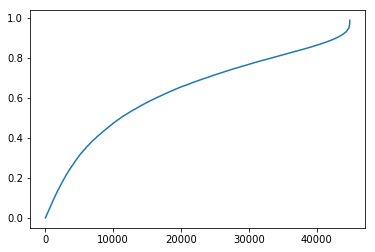

In [194]:
plt.plot(pearson_list_abs)

(array([    59.,    250.,    334.,    592.,   1160.,   2346.,   4634.,
          8805.,  16065.,  10605.]),
 array([-0.81238573, -0.63246811, -0.45255048, -0.27263286, -0.09271523,
         0.08720239,  0.26712002,  0.44703764,  0.62695527,  0.80687289,
         0.98679052]),
 <a list of 10 Patch objects>)

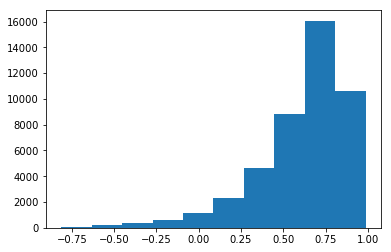

In [201]:
plt.hist(pearson_list)

(array([ 1294.,  1490.,  1878.,  2625.,  3564.,  5002.,  7090.,  9359.,
         9877.,  2671.]),
 array([  5.74174790e-06,   9.86842195e-02,   1.97362697e-01,
          2.96041175e-01,   3.94719653e-01,   4.93398130e-01,
          5.92076608e-01,   6.90755086e-01,   7.89433564e-01,
          8.88112041e-01,   9.86790519e-01]),
 <a list of 10 Patch objects>)

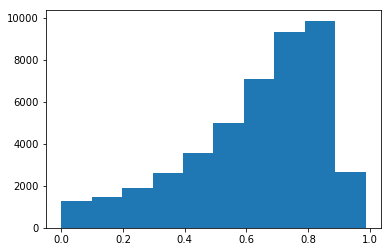

In [202]:
plt.hist(pearson_list_abs)

In [164]:
pearson_list_do_not_sort = []
for i in range(300):
    for j in range(i+1,300):
        pearson_list_do_not_sort.append(cal_pearson(stock_list_nodict[i],stock_list_nodict[j]))

In [170]:
tuple([1,2])

(1, 2)

In [48]:
network_list = []
for i in range(1,301):
    for j in range(i+1,301):
        network_list.append(tuple([i,j]))#将i与j边也做成一个标识放进list里面，与相关性系数一个接一个
        network_list.append(cal_pearson(stock_list_nodict[i-1],stock_list_nodict[j-1]))

In [38]:
network_list[0]

(1, 2)

In [39]:
len(network_list)#所以list的长度增加了一倍

89700

In [40]:
test = nx.Graph()

In [41]:
test.add_edges_from([network_list[0]])

In [42]:
network_list_cannotchange = []
for i in range(1,len(network_list),2):
    network_list_cannotchange.append(abs(network_list[i]))

In [43]:
len(network_list_cannotchange)

44850

In [44]:
network_list_cannotchange[44849]

0.33131775822966014

In [45]:
network_list_cut  =[]
for i in network_list:
    network_list_cut.append(i)

In [46]:
len(network_list_cut)

89700

In [49]:
for i in range(1,len(network_list_cut),2):
    if network_list_cut[i]<0.7 :#Pearson相关系数小于0.7的都剔除掉
        network_list.remove(network_list_cut[i-1])#标识也剔除
        network_list.remove(network_list_cut[i])#值也剔除
        

In [227]:
test_i = []
for i in range(1,len(network_list),2):
    test_i.append(i)

In [232]:
len(test_i)
print(test_i[44849])

89699


In [50]:
len(network_list)

42078

In [254]:

for i in range(0,len(network_list),2):
    print(network_list[i])

(1, 3)
(1, 4)
(1, 5)
(1, 6)
(1, 7)
(1, 8)
(1, 9)
(1, 10)
(1, 11)
(1, 12)
(1, 13)
(1, 15)
(1, 16)
(1, 17)
(1, 18)
(1, 19)
(1, 20)
(1, 21)
(1, 22)
(1, 23)
(1, 24)
(1, 25)
(1, 26)
(1, 28)
(1, 29)
(1, 30)
(1, 31)
(1, 32)
(1, 33)
(1, 34)
(1, 35)
(1, 36)
(1, 37)
(1, 38)
(1, 39)
(1, 40)
(1, 41)
(1, 43)
(1, 44)
(1, 45)
(1, 47)
(1, 48)
(1, 49)
(1, 50)
(1, 51)
(1, 52)
(1, 53)
(1, 54)
(1, 55)
(1, 56)
(1, 57)
(1, 58)
(1, 59)
(1, 60)
(1, 62)
(1, 63)
(1, 64)
(1, 65)
(1, 66)
(1, 67)
(1, 68)
(1, 69)
(1, 70)
(1, 71)
(1, 72)
(1, 73)
(1, 74)
(1, 75)
(1, 76)
(1, 77)
(1, 78)
(1, 79)
(1, 82)
(1, 83)
(1, 85)
(1, 86)
(1, 87)
(1, 88)
(1, 89)
(1, 90)
(1, 92)
(1, 93)
(1, 94)
(1, 96)
(1, 97)
(1, 98)
(1, 99)
(1, 101)
(1, 102)
(1, 105)
(1, 107)
(1, 108)
(1, 109)
(1, 110)
(1, 111)
(1, 113)
(1, 114)
(1, 116)
(1, 117)
(1, 118)
(1, 119)
(1, 121)
(1, 122)
(1, 123)
(1, 124)
(1, 125)
(1, 126)
(1, 127)
(1, 128)
(1, 129)
(1, 130)
(1, 131)
(1, 132)
(1, 133)
(1, 134)
(1, 135)
(1, 136)
(1, 137)
(1, 138)
(1, 139)
(1, 140)
(1, 1

In [60]:
network_stock = nx.Graph()
network_stock.add_nodes_from(range(1,301))#加入节点


In [61]:
network_stock.add_edges_from([network_list[i] for i in range(0,len(network_list),2)])#加入边

In [62]:
print(network_stock.nodes())
print(network_stock.edges())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 22

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


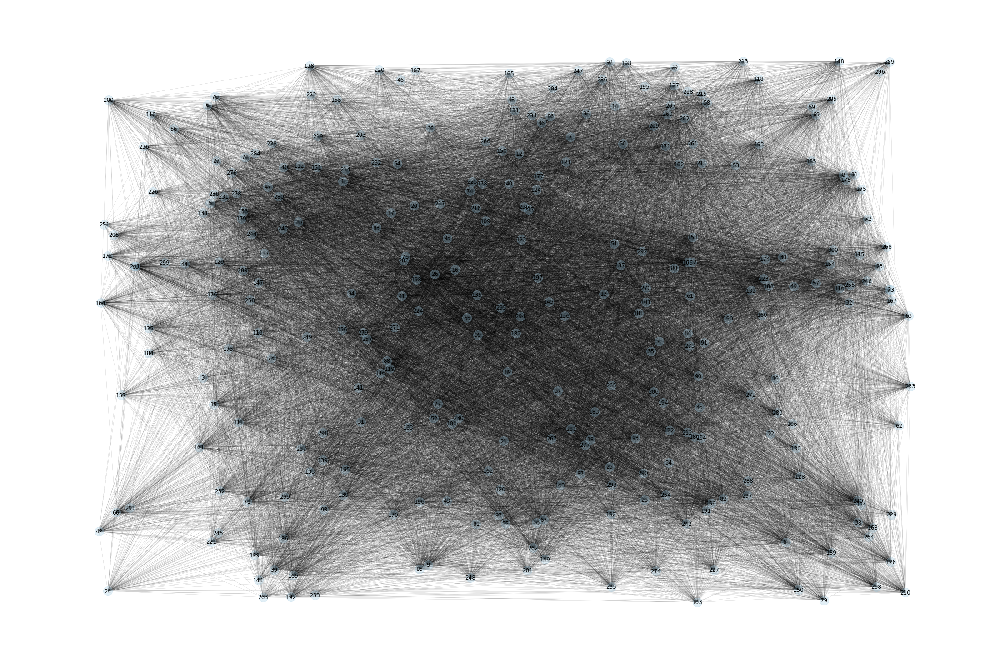

In [82]:
#network_stock.remove_node(64)
pos=nx.spring_layout(network_stock)
nx.draw_random(network_stock,with_labels=True,node_size=400,alpha=0.3,node_color='#A0CBE2',width=0.3,edge_cmap=plt.cm.Blues,edge_vmin=2,edge_vmax=3)
#plt.savefig("test2.png") # save as png
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

In [67]:
network_fast = clusterer.cluster(network_stock)

In [68]:
len(network_fast.clusters())

2

In [69]:
network_fast.clusters()[1]

{3,
 5,
 6,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 22,
 23,
 29,
 30,
 31,
 32,
 33,
 36,
 38,
 39,
 40,
 41,
 43,
 45,
 47,
 48,
 49,
 50,
 51,
 53,
 55,
 56,
 57,
 58,
 60,
 62,
 69,
 70,
 71,
 75,
 79,
 84,
 85,
 86,
 87,
 88,
 96,
 99,
 101,
 107,
 114,
 119,
 121,
 124,
 126,
 130,
 132,
 133,
 136,
 138,
 140,
 142,
 144,
 145,
 146,
 149,
 150,
 152,
 155,
 157,
 160,
 163,
 164,
 165,
 166,
 169,
 170,
 171,
 172,
 176,
 178,
 179,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 190,
 191,
 192,
 194,
 196,
 200,
 202,
 203,
 204,
 205,
 206,
 207,
 209,
 212,
 216,
 217,
 225,
 226,
 227,
 232,
 234,
 237,
 238,
 242,
 243,
 245,
 247,
 248,
 251,
 252,
 255,
 256,
 259,
 260,
 261,
 262,
 265,
 266,
 267,
 269,
 270,
 273,
 274,
 275,
 276,
 278,
 283,
 284,
 285,
 288,
 289,
 290,
 294,
 295,
 297}

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


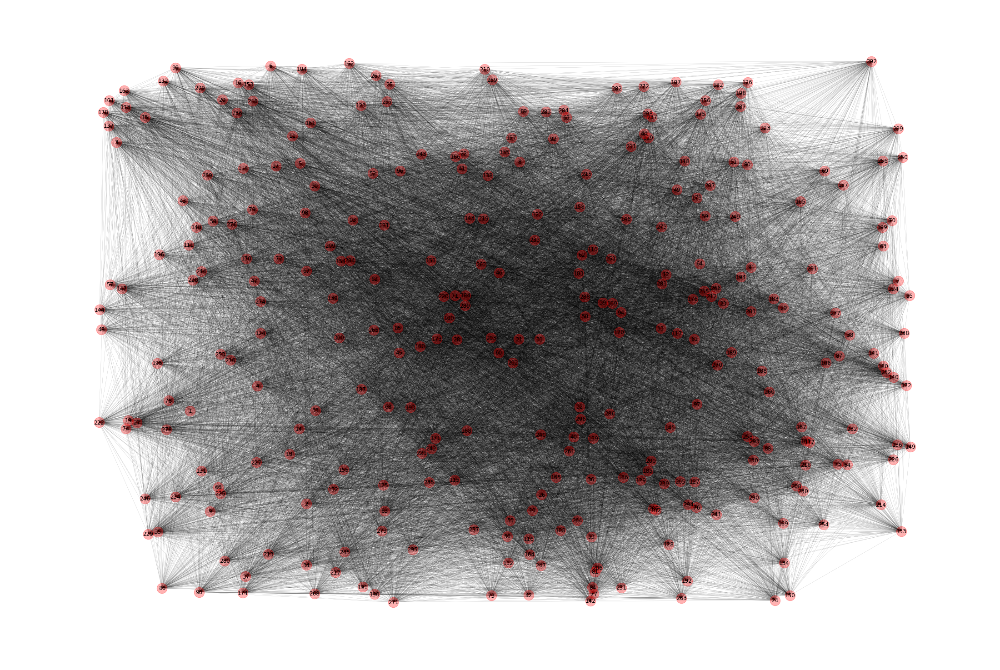

In [87]:
network_stock_fast = nx.Graph()
#network_stock_fast.add_nodes_from(range(2,34),35,range(37,64),65,66,range(68,84),85,86,87,range(89,107),range(108,112),range(113,301))
# network_stock_fast.add_nodes_from([35,65,66,85,86,87])
# network_stock_fast.add_nodes_from(range(2,34))
# network_stock_fast.add_nodes_from(range(37,64))
# network_stock_fast.add_nodes_from(range(68,84))
# network_stock_fast.add_nodes_from(range(89,107))
# network_stock_fast.add_nodes_from(range(108,112))
# network_stock_fast.add_nodes_from(range(113,301))
network_stock_fast.add_nodes_from(range(1,301))
for i in range(len(network_fast.clusters())):
    network_stock_fast.add_edges_from(edges_list(network_fast.clusters()[i]))
#network_stock_fast.add_edges_from(edges_list(network_fast.clusters()[1]))

nx.draw_random(network_stock_fast,with_labels=True,node_size=500,alpha=0.3,node_color='r',width=0.3)#,edge_vmin=5,edge_vmax=10
#plt.savefig("test2.png") # save as png
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

## 需要对线性相关系数进行改进
### 用移动平均线作出股票的趋势图，对每个时点，求两支股票趋势图的斜率（增量）乘积，若两支股票有很好的联动性，趋势同增同减，则乘积为正，否则为负
### 乘积在时段上求和，如果联动性不明显，则乘积有正有负，正负相消接近0；如果联动性明显，则会得到很大的正值
### 对天数求平均，得到联动相关性系数
$$ r_{ij}  = \frac{1}{T}\sum_{t=1}^{T-1}[\frac{p_{i}(t+1)-p_{i}(t)}{p_{i}(t)}\cdot \frac{p_{j}(t+1)-p_{j}(t)}{p_{j}(t)}]$$

In [8]:
len(stock_list_nodict)

300

In [92]:
rd_df

,000001,000002,000009,000027,000039,000046,000060,000061,000063,000069,...,601985,601988,601989,601991,601992,601998,603000,603288,603885,603993
2014-11-11,7.645,8.914,9.155,5.257,16.440,5.663,7.604,10.960,12.067,5.672,...,6.575500,2.878,6.046,4.122,3.483,5.089,21.050,19.753,17.765500,2.457
2014-11-12,7.597,9.016,9.221,5.443,16.770,6.054,7.883,11.109,12.099,5.859,...,5.696750,2.814,6.055,4.140,3.582,5.041,21.263,20.297,12.837250,2.467
2014-11-13,7.495,8.830,8.949,5.231,16.624,6.152,8.143,11.268,11.945,5.790,...,5.257375,2.832,5.936,4.056,3.532,4.973,20.906,20.080,10.373125,2.533
2014-11-14,7.414,8.979,9.044,5.084,17.081,6.171,7.893,11.079,12.018,5.996,...,5.037687,2.823,6.026,4.084,3.448,4.896,21.080,19.726,9.141063,2.480
2014-11-17,7.299,8.793,8.963,5.148,17.178,6.054,7.824,11.109,12.059,5.908,...,4.927844,2.759,5.986,4.056,3.542,4.780,22.033,19.848,8.525031,2.477
2014-11-18,7.197,8.626,9.199,5.109,17.537,6.025,7.784,11.128,12.083,5.692,...,4.872922,2.677,5.896,4.009,3.557,4.742,22.132,20.170,8.217016,2.516
2014-11-19,7.210,8.533,9.177,5.193,16.984,6.064,7.744,11.476,12.335,5.633,...,4.845461,2.668,5.826,4.027,3.711,4.771,22.226,20.091,8.063008,2.471
2014-11-20,7.210,8.579,9.103,5.193,16.974,6.064,7.794,11.268,12.156,5.633,...,4.831730,2.668,5.716,4.018,3.711,4.800,21.720,20.033,7.986004,2.444
2014-11-21,7.326,8.700,9.103,5.327,17.197,6.220,7.824,11.337,12.173,5.751,...,4.824865,2.695,5.796,4.046,3.811,4.915,22.435,20.085,7.947502,2.441
2014-11-24,7.312,9.424,9.508,5.449,17.683,6.845,7.993,11.586,12.270,6.006,...,4.821433,2.686,6.036,4.150,4.039,4.925,22.286,19.985,7.928251,2.507


In [9]:
len(stock_list_nodict[0])

286

In [10]:
#定义联动相关系数
def der_correlative(list1,list2,t=1):
    T = len(list1)
    sum_pq = 0
    for i in range(len(list1)-1):
        p = (list1[i+t]-list1[i])/list1[i]
        q = (list2[i+t]-list2[i])/list2[i]
        p_q = p*q
        sum_pq += p_q
    r_pq = sum_pq/T
    return r_pq*1000

In [11]:
print(der_correlative(stock_list_nodict[0],stock_list_nodict[0]))

0.9054739433433217


## 此外，我们将日收盘价替代为三天移动平均价格，选择3天是因为这个趋势线相对地光滑而且更有效地处理数据，即
$$p_{i} = (p_{i} +p_{i} +p_{i+1} )/3$$

## 为了处理数据方便，我们将所有数据乘以$10^{3}$

In [12]:

stock_moving_list = []
for i in range(len(stock_list_nodict)):
    stock_inside_list = []
    for j in range(1,len(stock_list_nodict[i])-1):
        a = (stock_list_nodict[i][j-1]+stock_list_nodict[i][j]+stock_list_nodict[i][j+1])/3
        stock_inside_list.append(a)
    
    stock_moving_list.append(stock_inside_list)

In [13]:
len(stock_moving_list[0])

284

In [14]:
print(der_correlative(stock_moving_list[0],stock_moving_list[9]))

0.20878809233680548


In [15]:
cor_list = []
for i in range(300):
    for j in range(i+1,300):
        cor_list.append(der_correlative(stock_moving_list[i],stock_moving_list[j]))#计算联动相关性系数

In [16]:
len(cor_list)

44850

In [17]:
cor_list.sort()

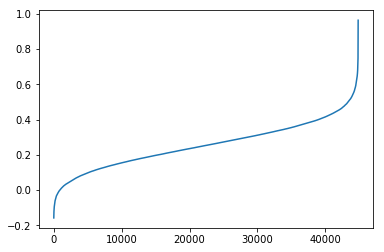

In [20]:
plt.plot(cor_list)

(array([  2.74000000e+02,   2.90900000e+03,   9.52400000e+03,
          1.46870000e+04,   1.18070000e+04,   4.46700000e+03,
          9.80000000e+02,   1.77000000e+02,   2.20000000e+01,
          3.00000000e+00]),
 array([-0.15750082, -0.04538417,  0.06673248,  0.17884913,  0.29096578,
         0.40308243,  0.51519909,  0.62731574,  0.73943239,  0.85154904,
         0.96366569]),
 <a list of 10 Patch objects>)

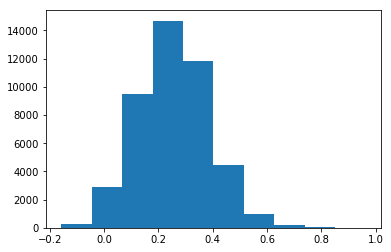

In [21]:
plt.hist(cor_list)

In [22]:
network_list1 = []
for i in range(1,301):
    for j in range(i+1,301):
        network_list1.append(tuple([i,j]))#加入标识
        network_list1.append(der_correlative(stock_moving_list[i-1],stock_moving_list[j-1]))#加入改进后的相关系数值

In [23]:
network_list_cut1  =[]
for i in network_list1:
    network_list_cut1.append(i)

In [24]:
for i in range(1,len(network_list_cut1),2):
    if network_list_cut1[i]<0.45 :#小于0.45的都剔除
        network_list1.remove(network_list_cut1[i-1])
        network_list1.remove(network_list_cut1[i])

In [25]:
len(network_list1)

6006

In [26]:
node_init_list = []
for i in range(0,len(network_list1)-1,2):
    x,y = network_list1[i]
    node_init_list.append(x)
    node_init_list.append(y)

In [27]:
len(node_init_list)

6006

## 设置阈值后，获得还具有联动性的股票代号

In [28]:
# 去除node_init_list中的重复的元素
node_list = []
for i in node_init_list:
    if i not in node_list:
        node_list.append(i)

In [29]:
len(node_list)

180

In [30]:
ids = [1,2,3,3,4,2,3,4,5,6,1]
news_ids = []
for id in ids:
    if id not in news_ids:
        news_ids.append(id)

print(news_ids)

[1, 2, 3, 4, 5, 6]


In [31]:
network_stock1 = nx.Graph()
network_stock1.add_nodes_from(node_list)
network_stock1.add_edges_from([network_list1[i] for i in range(0,len(network_list1),2)])

E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
E:\anconda\lib\site-packages\networkx\drawing\nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
E:\anconda\lib\site-packages\matplotlib\__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
E:\anconda\lib\site-packages\matplotlib\rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


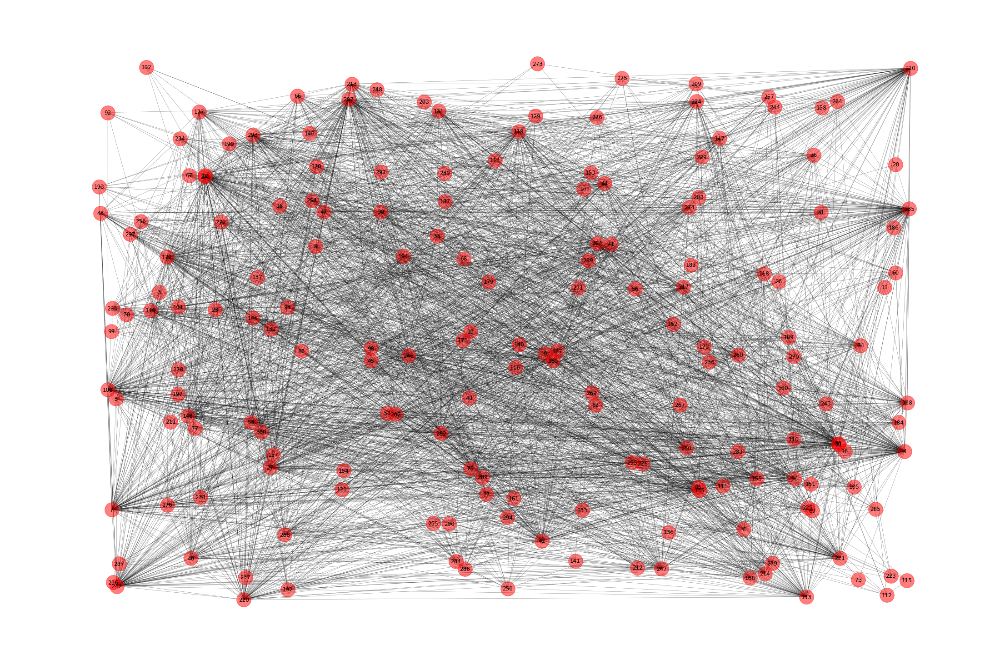

In [32]:
#network_stock.remove_node(64)
pos=nx.spring_layout(network_stock1)
nx.draw_random(network_stock1,with_labels=True,node_size=1000,alpha=0.5,node_color='r',width=0.5,edge_cmap=plt.cm.Blues,edge_vmin=2,edge_vmax=3)
#plt.savefig("test2.png") # save as png
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

In [33]:
from hac import GreedyAgglomerativeClusterer
import networkx as nx
clusterer = GreedyAgglomerativeClusterer()

In [34]:
network_fast1 = clusterer.cluster(network_stock1)

In [35]:
network_fast1.max_clusters

180

In [233]:
a = network_fast1.crawl

In [171]:
len(network_fast1.clusters())

3

In [174]:
node_cluster = []
for i in range(len(network_fast1.clusters())):
    for j in network_fast1.clusters()[i]:
        if j not in node_cluster:
            node_cluster.append(j)

In [176]:
len(node_cluster)

101

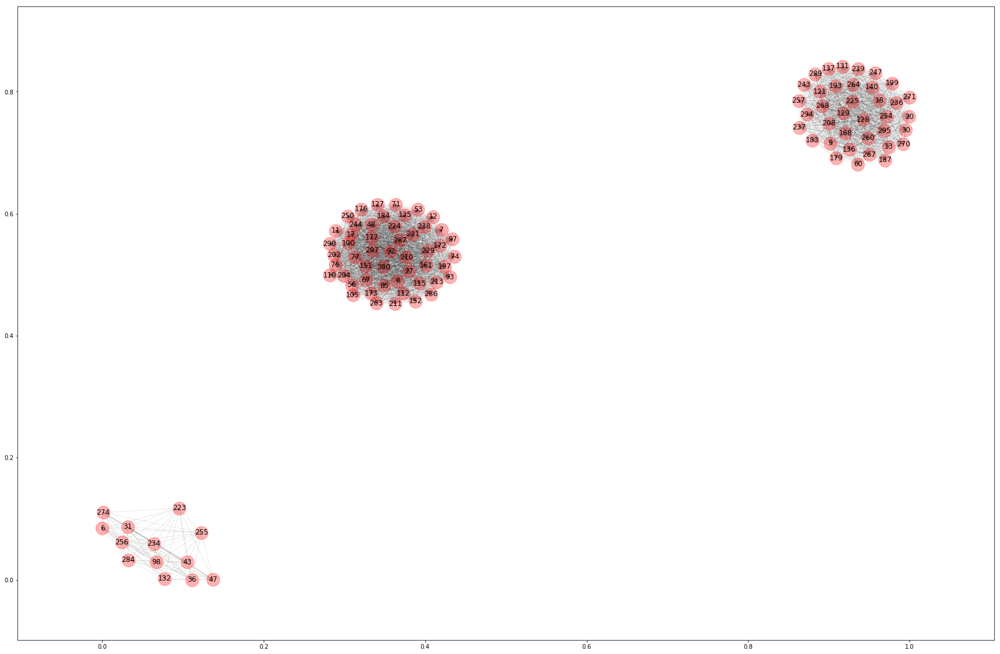

In [333]:
network_stock_fast1 = nx.Graph()
network_stock_fast1.add_nodes_from(node_cluster)
for i in range(len(network_fast1.clusters())):
    network_stock_fast1.add_edges_from(edges_list(network_fast1.clusters()[i]))
#network_stock_fast.add_edges_from(edges_list(network_fast.clusters()[1]))

nx.draw_networkx(network_stock_fast1,with_labels=True,node_size=500,alpha=0.3,node_color='r',width=0.3)#,edge_vmin=5,edge_vmax=10
#plt.savefig("test2.png") # save as png
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

## Q值的计算

### 衡量网络模块化的指标Q值
#### 设网络为$N=(V,E),P_{k}={(V_{1},E_{1}),(V_{2},E_{2}),...,(V_{k},E_{k})}$为一个分划
#### $E_{ij}$表示网络中连接两个不同社区点的边在所有边中所占的比例，这两点节点分别位于第i个社区和第j个社区。
#### 定义每行（或者列）中各元素之和为$a_{i} = \sum_{j} E_{ij}$
#### Newman和Girvan提出一种衡量网络社区结构的指标Q值
$$Q = \sum_{i}(E_{ij}-a_{i}^{2}) = Tr(E)-||E^{2}||$$

In [36]:
nx.edge_betweenness_centrality(network_stock1)

{(50, 96): 0.00036685741396280024,
 (168, 235): 0.0008978243215016053,
 (44, 147): 0.00022537930957852568,
 (56, 246): 0.0004175721797843715,
 (131, 187): 0.0005363416899217806,
 (264, 280): 0.0008374125048295668,
 (7, 250): 0.0007328096546357664,
 (30, 213): 0.0001452259173648145,
 (12, 138): 0.00021000834105298224,
 (36, 256): 0.00017770365465264349,
 (135, 204): 0.00025626675574236995,
 (140, 153): 0.0002542647271187626,
 (145, 226): 0.0006177193402182694,
 (75, 97): 0.001539265987482221,
 (148, 297): 0.0002887446231145216,
 (5, 187): 0.00011362312443094234,
 (23, 204): 0.00031843866702130244,
 (44, 138): 0.00033590465920273357,
 (27, 194): 0.00032708498376040555,
 (260, 271): 0.0001910928882840951,
 (6, 202): 0.00034305518089523996,
 (27, 115): 0.003097405119586478,
 (30, 220): 0.00021996829061641214,
 (42, 67): 0.0005250587031198028,
 (131, 280): 0.0004125476282573252,
 (23, 197): 0.0001922359635247543,
 (99, 108): 0.005742906847679483,
 (192, 207): 0.0006534762914737199,
 (149, 2

## 聚集系数
### 一个节点的聚类系数是这个节点讯在的连接点数与最大可能的连接点数的比值，一个网络整体的聚类系数是各个节点聚类系数的取平均值。

In [201]:
nx.clustering(network_stock1)

{3: 1.0,
 4: 0.33539944903581265,
 5: 0.9001782531194296,
 6: 0.6321321321321322,
 7: 0.39600448095593727,
 8: 0.9556451612903226,
 9: 1.0,
 11: 0.0,
 12: 0.6152882205513784,
 13: 0.9818181818181818,
 16: 0.9722222222222222,
 17: 0.8393234672304439,
 18: 0.7636363636363637,
 20: 1.0,
 23: 0.7428571428571429,
 26: 0.6571428571428571,
 27: 0.37545787545787546,
 30: 0.7571644042232277,
 31: 0.7566137566137566,
 33: 0.7363945578231292,
 36: 0.6045883940620783,
 40: 0.6095791001451378,
 42: 0.44072164948453607,
 43: 0.6543385490753911,
 44: 0.5951293759512938,
 45: 0.84,
 47: 0.7891737891737892,
 48: 1.0,
 50: 0.5938541281007035,
 51: 0.702865761689291,
 53: 0.6274801587301587,
 56: 0.9633333333333334,
 58: 1.0,
 60: 0.9122807017543859,
 62: 0.9411764705882353,
 66: 0.8873873873873874,
 67: 0.9107692307692308,
 68: 1.0,
 69: 0.7564102564102564,
 70: 0.9615384615384616,
 71: 0.7536585365853659,
 73: 1.0,
 74: 0.5746606334841629,
 75: 0.4578577699736611,
 77: 0.7894736842105263,
 85: 1.0,
 86

In [202]:
nx.average_clustering(network_stock1)

0.7509111607261525

In [203]:
nx.average_degree_connectivity(network_stock1)

{1: 63.0,
 2: 81.125,
 3: 58.666666666666664,
 4: 78.16666666666667,
 5: 81.95,
 6: 75.6,
 7: 67.64285714285714,
 8: 52.791666666666664,
 9: 77.37777777777778,
 10: 73.2,
 11: 83.43181818181819,
 12: 59.0625,
 13: 73.61538461538461,
 14: 64.85714285714286,
 15: 69.8,
 16: 49.90625,
 17: 75.5,
 18: 67.38194444444444,
 19: 73.36842105263158,
 20: 58.23571428571429,
 21: 59.714285714285715,
 22: 75.97727272727273,
 23: 42.17391304347826,
 24: 69.29166666666667,
 25: 58.416,
 26: 72.3076923076923,
 27: 53.0,
 28: 56.375,
 29: 78.94252873563218,
 32: 77.95833333333333,
 33: 69.06060606060606,
 34: 73.67647058823529,
 36: 65.5,
 37: 65.20270270270271,
 38: 67.57236842105263,
 39: 53.205128205128204,
 40: 64.7,
 41: 62.39837398373984,
 42: 63.083333333333336,
 44: 71.06818181818181,
 48: 67.41666666666667,
 49: 64.36734693877551,
 50: 67.88,
 51: 56.411764705882355,
 52: 61.93589743589744,
 53: 58.81761006289308,
 54: 56.03703703703704,
 55: 65.58181818181818,
 56: 52.625,
 57: 60.81578947368

In [204]:
print(network_stock1.degree(3))#返回某个节点的度
print(network_stock1.degree())#返回所有节点的度
print(nx.degree_histogram(network_stock1))#返回图中所有节点的度分布序列（从1至最大度的出现频次）
#nx.draw(gg)
#plt.show()

5
{3: 5, 4: 121, 5: 34, 6: 37, 7: 104, 8: 32, 9: 4, 11: 1, 12: 57, 13: 11, 16: 9, 17: 44, 18: 11, 20: 2, 23: 36, 26: 15, 27: 105, 30: 52, 31: 28, 33: 49, 36: 39, 40: 53, 42: 97, 43: 38, 44: 73, 45: 25, 47: 27, 48: 4, 50: 74, 51: 52, 53: 64, 56: 25, 58: 9, 60: 19, 62: 18, 66: 37, 67: 26, 68: 2, 69: 40, 70: 13, 71: 41, 73: 4, 74: 52, 75: 68, 77: 20, 85: 2, 86: 4, 92: 7, 93: 38, 96: 60, 97: 5, 98: 27, 99: 8, 100: 5, 101: 27, 102: 6, 105: 26, 108: 104, 110: 18, 111: 24, 112: 9, 114: 17, 115: 5, 116: 1, 118: 42, 119: 102, 121: 4, 127: 48, 128: 18, 129: 20, 131: 74, 132: 18, 133: 20, 135: 60, 136: 1, 137: 2, 138: 63, 140: 41, 141: 5, 143: 76, 145: 41, 146: 6, 147: 44, 148: 82, 149: 66, 151: 18, 152: 20, 153: 21, 154: 5, 155: 54, 157: 10, 158: 7, 161: 11, 168: 38, 170: 34, 171: 14, 172: 93, 173: 2, 176: 32, 177: 53, 179: 6, 183: 2, 184: 29, 185: 97, 186: 10, 187: 25, 189: 20, 192: 29, 193: 14, 194: 62, 197: 22, 199: 33, 202: 61, 203: 11, 204: 82, 207: 123, 208: 8, 209: 17, 210: 89, 211: 9, 21

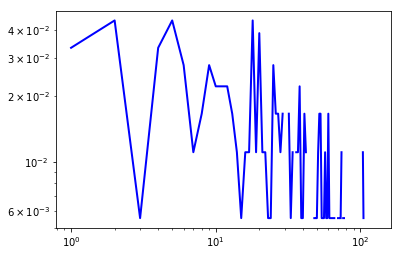

In [193]:
degree =  nx.degree_histogram(network_stock1)          #返回图中所有节点的度分布序列
x = range(len(degree))                             #生成x轴序列，从1到最大度
y = [z / float(sum(degree)) for z in degree]  
#将频次转换为频率，这用到Python的一个小技巧：列表内涵，Python的确很方便
plt.loglog(x,y,color="blue",linewidth=2)           #在双对数坐标轴上绘制度分布曲线  
plt.show()   

In [194]:
len(degree)#也可以表示为最大的度

128

## 计算模块度Q值

In [272]:
network_fast1.clusters(180)

[{300},
 {295},
 {294},
 {284},
 {290},
 {274},
 {287},
 {234},
 {289},
 {271},
 {286},
 {257},
 {239},
 {183},
 {247},
 {270},
 {229},
 {238},
 {210},
 {255},
 {187},
 {260},
 {137},
 {263},
 {267},
 {268},
 {236},
 {264},
 {243},
 {256},
 {85},
 {184},
 {211},
 {132},
 {207},
 {202},
 {176},
 {98},
 {172},
 {197},
 {131},
 {250},
 {208},
 {127},
 {135},
 {177},
 {204},
 {74},
 {129},
 {254},
 {224},
 {244},
 {100},
 {237},
 {140},
 {223},
 {121},
 {225},
 {173},
 {6},
 {179},
 {136},
 {151},
 {48},
 {7},
 {11},
 {115},
 {97},
 {60},
 {112},
 {152},
 {31},
 {168},
 {17},
 {30},
 {8},
 {9},
 {43},
 {56},
 {53},
 {18},
 {92},
 {27},
 {161},
 {213},
 {36},
 {193},
 {128},
 {67},
 {13},
 {12},
 {199},
 {71},
 {20},
 {77},
 {75},
 {47},
 {105},
 {93},
 {110},
 {231}]

In [37]:
def Q1(comm,G):
    edges=G.edges()
    m=len(edges)
    #每个节点的度
    du=G.degree()
    #通过节点对（同一个社区内的节点对）计算
    ret=0.0
    for c in comm:
        for x in c:
            for y in c:
                #边都是前小后大的
                #不能交换x，y，因为都是循环变量
                if x<=y:
                    if (x,y) in edges:
                        aij=1.0
                    else:
                        aij=0.0
                else:
                    if (y,x) in edges:
                        aij=1.0
                    else:
                        aij=0
                tmp=aij-du[x]*du[y]*1.0/(2*m)
                ret=ret+tmp
    ret=ret*1.0/(2*m)
    return ret

In [38]:
for i in network_fast1.clusters()[1]:
        print(i)

128
129
257
131
260
136
9
137
264
140
13
267
268
270
271
18
20
30
289
294
295
168
179
183
187
60
193
199
208
225
236
237
239
243
247
121
254


In [39]:
def set_to_list(clusters):#将数据结构set转化为list
    network_clusters=[]
    for i in clusters:
        tt = list(i)
        tt.sort()
        network_clusters.append(tt)
    return network_clusters

In [40]:
set_to_list(network_fast1.clusters())[1]

[9,
 13,
 18,
 20,
 30,
 60,
 121,
 128,
 129,
 131,
 136,
 137,
 140,
 168,
 179,
 183,
 187,
 193,
 199,
 208,
 225,
 236,
 237,
 239,
 243,
 247,
 254,
 257,
 260,
 264,
 267,
 268,
 270,
 271,
 289,
 294,
 295]

In [41]:
q_values = []
for i in range(1,181):
    q_values.append(Q1(set_to_list(network_fast1.clusters(i)),network_stock1))

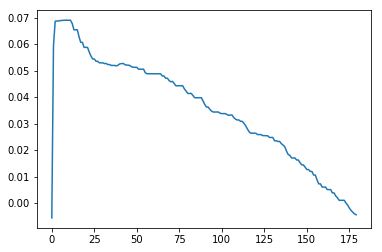

In [42]:
plt.plot(q_values)

In [342]:
q_values

[-0.005579529805303998,
 0.05951787695044384,
 0.06863097497463079,
 0.06872412192092463,
 0.06872412192092463,
 0.06890952869973803,
 0.06890952869973803,
 0.069010604225389,
 0.069010604225389,
 0.069010604225389,
 0.069010604225389,
 0.069010604225389,
 0.06779137723193626,
 0.06541391231700881,
 0.06541391231700881,
 0.06541391231700881,
 0.06284228037474751,
 0.0606755049811989,
 0.0606755049811989,
 0.058770483595658056,
 0.058770483595658056,
 0.058770483595658056,
 0.05702697236163735,
 0.05556295741110892,
 0.0543972899117751,
 0.0543972899117751,
 0.05352198583966783,
 0.05352198583966783,
 0.052934827410351555,
 0.052934827410351555,
 0.052934827410351555,
 0.052679671311039615,
 0.052679671311039615,
 0.052285127459952306,
 0.052285127459952306,
 0.05195495480210731,
 0.05195495480210731,
 0.05195495480210731,
 0.05177232025383837,
 0.05206340446100654,
 0.05254704780179276,
 0.05263476117621946,
 0.0527222527722026,
 0.05224021732513221,
 0.0520831981870941,
 0.05208319818

In [43]:
len(network_fast1.clusters(11))#划分社团的个数

6

In [44]:
list(network_fast1.clusters(11)[2])#选取其中一个社团里面的节点

[256, 98, 223, 36, 132, 6, 234, 43, 47, 274, 284, 31, 255]

In [45]:
#选取这个社团节点之间的边
test_comm = []
for i in network_fast1.clusters(11)[2]:
    for j in network_fast1.clusters(11)[2]:
        for k in network_stock1.edges():
            if (i,j) == k:
                test_comm.append((i,j))

In [46]:
test_comm

[(256, 274),
 (256, 284),
 (98, 256),
 (98, 223),
 (98, 132),
 (98, 234),
 (98, 274),
 (98, 284),
 (223, 274),
 (36, 256),
 (36, 98),
 (36, 223),
 (36, 132),
 (36, 234),
 (36, 43),
 (36, 47),
 (36, 274),
 (36, 284),
 (132, 256),
 (132, 234),
 (132, 274),
 (132, 284),
 (6, 256),
 (6, 98),
 (6, 36),
 (6, 234),
 (6, 43),
 (6, 47),
 (6, 274),
 (6, 284),
 (6, 31),
 (234, 256),
 (234, 274),
 (234, 284),
 (43, 256),
 (43, 98),
 (43, 223),
 (43, 132),
 (43, 234),
 (43, 47),
 (43, 274),
 (43, 284),
 (47, 256),
 (47, 98),
 (47, 132),
 (47, 234),
 (47, 274),
 (47, 284),
 (274, 284),
 (31, 256),
 (31, 98),
 (31, 36),
 (31, 132),
 (31, 234),
 (31, 43),
 (31, 47),
 (31, 274),
 (31, 284),
 (255, 274)]

In [49]:
edges_list(network_fast1.clusters(11)[2])

[(256, 98),
 (256, 223),
 (256, 36),
 (256, 132),
 (256, 6),
 (256, 234),
 (256, 43),
 (256, 47),
 (256, 274),
 (256, 284),
 (256, 31),
 (256, 255),
 (98, 223),
 (98, 36),
 (98, 132),
 (98, 6),
 (98, 234),
 (98, 43),
 (98, 47),
 (98, 274),
 (98, 284),
 (98, 31),
 (98, 255),
 (223, 36),
 (223, 132),
 (223, 6),
 (223, 234),
 (223, 43),
 (223, 47),
 (223, 274),
 (223, 284),
 (223, 31),
 (223, 255),
 (36, 132),
 (36, 6),
 (36, 234),
 (36, 43),
 (36, 47),
 (36, 274),
 (36, 284),
 (36, 31),
 (36, 255),
 (132, 6),
 (132, 234),
 (132, 43),
 (132, 47),
 (132, 274),
 (132, 284),
 (132, 31),
 (132, 255),
 (6, 234),
 (6, 43),
 (6, 47),
 (6, 274),
 (6, 284),
 (6, 31),
 (6, 255),
 (234, 43),
 (234, 47),
 (234, 274),
 (234, 284),
 (234, 31),
 (234, 255),
 (43, 47),
 (43, 274),
 (43, 284),
 (43, 31),
 (43, 255),
 (47, 274),
 (47, 284),
 (47, 31),
 (47, 255),
 (274, 284),
 (274, 31),
 (274, 255),
 (284, 31),
 (284, 255),
 (31, 255)]

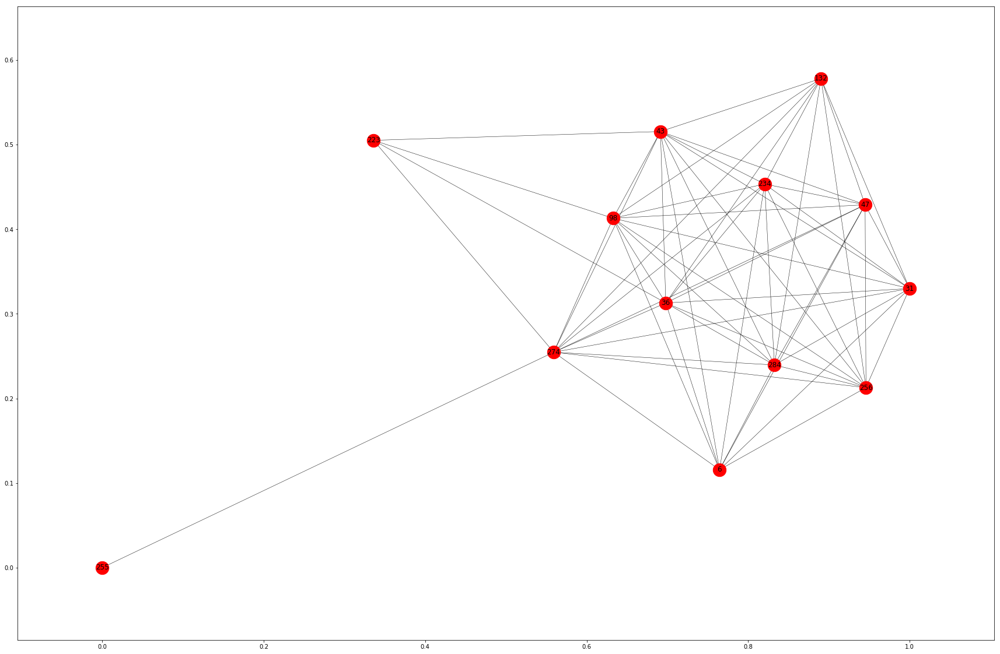

In [50]:
comm = nx.Graph()
comm.add_nodes_from(list(list(network_fast1.clusters(11)[2])))
comm.add_edges_from(test_comm)
nx.draw_networkx(comm,with_labels=True,node_size=500,alpha=1,node_color='r',width=0.5)#,edge_vmin=5,edge_vmax=10
#plt.savefig("test2.png") # save as png
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

In [51]:
couu_1 = list(network_fast1.clusters(11)[2])
couu_1.remove(223)
couu_1.remove(255)
print(couu_1)

[256, 98, 36, 132, 6, 234, 43, 47, 274, 284, 31]


In [52]:
stock_list_nodict[0]

[7.645,
 7.597,
 7.495,
 7.414,
 7.299,
 7.197,
 7.21,
 7.21,
 7.326,
 7.312,
 7.448,
 7.604,
 7.672,
 8.438,
 8.269,
 8.899,
 8.886,
 9.469,
 9.856,
 10.331,
 9.3,
 9.625,
 9.442,
 9.456,
 9.211,
 9.761,
 10.419,
 10.1,
 10.175,
 10.405,
 10.005,
 9.544,
 9.964,
 10.243,
 10.12,
 10.514,
 10.744,
 10.867,
 10.704,
 10.5,
 10.148,
 10.229,
 10.019,
 9.958,
 10.046,
 10.412,
 10.426,
 9.381,
 9.381,
 9.781,
 9.7,
 9.768,
 9.727,
 9.49,
 9.537,
 9.429,
 9.449,
 9.245,
 9.462,
 9.3,
 9.354,
 9.164,
 9.171,
 9.34,
 9.313,
 9.401,
 9.462,
 9.442,
 9.49,
 9.361,
 9.544,
 9.49,
 9.517,
 9.225,
 9.205,
 9.076,
 9.117,
 9.598,
 9.34,
 9.401,
 9.903,
 10.168,
 10.453,
 10.446,
 10.521,
 10.304,
 10.392,
 10.466,
 10.412,
 10.114,
 10.249,
 10.229,
 10.622,
 10.683,
 10.826,
 10.717,
 10.751,
 11.402,
 12.155,
 12.21,
 13.431,
 13.578,
 13.381,
 13.668,
 13.955,
 13.898,
 13.381,
 13.594,
 13.914,
 13.676,
 13.249,
 13.479,
 13.709,
 13.668,
 13.709,
 13.561,
 13.02,
 12.905,
 12.864,
 13.011,
 1

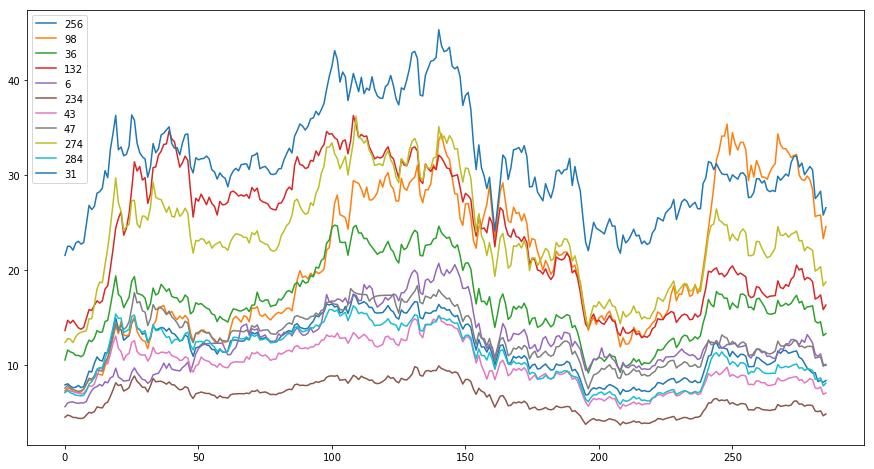

In [53]:
plt.figure(figsize=(15,8))
for i in couu_1:
    j = i-1
    plt.plot(stock_list_nodict[j],label = i)

plt.legend(loc = 'upper left')
plt.show()